# Scenario 2
Module Code: CSMAD21

Assignment report Title: Applied Data Science with Python

Student Number (e.g. 25098635): 27007990

Date (when the work completed): 10/01/2021

Actual hrs spent for the assignment: 50+

Assignment evaluation (3 key points):
- Really interesting assignment
- Lots of revisiting occurring with all tasks
- Maybe introduce plotly (Although it's slower, it's much cleaner for visualisations, especially networks)

## Imports / Setup

In [1]:
!pip install -r requirements.txt
import datatable as dt
import datetime
import glob
import googlemaps
import json
import matplotlib.pyplot as plt
import pandas as pd
import requests
import numpy as np
import plotly.graph_objects as go
from sklearn.cluster import KMeans, DBSCAN
from sklearn_extra.cluster import KMedoids
from plotly.subplots import make_subplots
from sklearn.neighbors import NearestNeighbors
from datetime import datetime
from pathlib import Path
import os
from os import path
import pyprojroot
os.chdir(pyprojroot.here())

# Resolves "no renderer" error
# pio.renderers.default = 'iframe_connected'
# Default Matplotlib Plot Settings
graph_style = "ggplot"
graph_size = (25, 15)

# Reads in api key from text file called "api_key.txt" in local directory
API_KEY = Path("api_key.txt").read_text()
# Initialise googlemaps API client given the API_KEY
client = googlemaps.Client(API_KEY)

# Makes data folder for data downloaded
if not path.exists("data/"):
    os.mkdir("data/")
    
# Miscellaneous functions
def addlabels(x, y):
    """Adds labels to center bars of matplotlib barplots
    https://www.geeksforgeeks.org/adding-value-labels-on-a-matplotlib-bar-chart/
    Args:
        x (float)): x coord of element we want to label
        y (float): y coord of element we want to label
    """
    for i in range(len(x)):
        plt.text(i, y[i] // 2, y[i], ha="center", fontsize="xx-large")


# Downloading / Cleaning Postcode Area Data

Created functions for downloading any postcode area's data from doogal uk. 

Created functions for reading postcode data for any given postcode area. 

lso created a function that retrieves long/lat values given an address (Uses Google Maps API). 

Finally made a function that uses Google Maps API that gets the travel distance / duration from the first 5 postcodes in the postcode area dataframe to the whiteknights campus long/lat.


In [2]:
def download_postcode_area_data(area):
    """Downloads postcode area data and save as file to local dir

    Args:
        area (str): The postcode area we want to download information for
    """
    # Initialise file directory / name
    file_path = f"data/{area}_postcodes.csv"
    # If file containing this postcode area's data doesn't already exist
    if not Path(file_path).is_file():
        # Get request with URL
        req = requests.get(
            f"https://www.doogal.co.uk/UKPostcodesCSV.ashx?Search={area}"
        )
        # Create new file in local dir
        csv_file = open(f"data/{area}_postcodes.csv", "wb")
        # Write get request's csv content to file
        csv_file.write(req.content)
        # Close file so it's no longer loaded in memory and is saved in storage
        csv_file.close()


def download_london_postcode_data():
    """Downloads london data and save as file to local dir"""
    # Get London Postcodes
    file_path = "data/london_postcodes.csv"
    if not Path(file_path).is_file():
        req = requests.get(f"https://www.doogal.co.uk/UKPostcodesCSV.ashx?area=London")
        url_content = req.content
        postcode_content.append(url_content)
        csv_file = open(f"data/london_postcodes.csv", "wb")
        csv_file.write(url_content)
        csv_file.close()


def combine_postcode_area_data():
    """Combines all postcode area files into a single file"""
    if Path("combined_postcodes_csv.csv").is_file():
        print("Reading in global csv")
        combined_csv = dt.fread("combined_postcodes_csv.csv").to_pandas()
    else:
        # Read all postcode csv files
        all_filenames = [i for i in glob.glob("*_postcodes.{}".format("csv"))]
        # combine all files in the list
        combined_csv = pd.concat([dt.fread(f).to_pandas() for f in all_filenames])
        # export to csv
        dataframes = []
        for file in all_filenames:
            dataframes.append(dt.fread(f"{file}").to_pandas())
        combined_csv = pd.concat(dataframes)
        combined_csv.to_csv(
            "combined_postcodes_csv.csv", index=False, encoding="utf-8-sig"
        )


def read_postcode_area_data(area):
    """Reads postcode area data directly from URL and returns the dataframe
    If postcode area file doesn't exist, it downloads it and reads it into memory then returns it
    Args:
        area (str)): postcode area

    Returns:
        pd.DataFrame: postcode area data
    """
    # Location of postcode area data in local dir
    file_path = f"data/{area}_postcodes.csv"
    # If file doesn't exist, download it and save to storage
    if not Path(file_path).is_file():
        # Download postcode area data
        if area == "london":
            download_postcode_area_data()
        else:
            download_postcode_area_data(area)
    print(f"[*]\tPostcode area '{area}' data loaded into memory")
    # Load postcode area data from storage into memory and return it
    return pd.read_csv(f"data/{area}_postcodes.csv")


def clean_data(df):
    """Data preprocessing/cleaning of postcode area data
    - Removes rows with invalid/useless longitude/latitude values
    - (DEPRECATED) No longer in use: Removes rows with postcodes that are no longer in use (Assuming it's because the locations are used by other postcodes, deprecating old ones)
    Args:
        df (pd.DataFrame): postcode area data

    Returns:
        pd.DataFrame: Refined/cleaned postcode area data
    """

    # Replace lat/long values that equal 0 with null values
    df["Longitude"] = df["Longitude"].replace(0, np.nan)
    df["Latitude"] = df["Latitude"].replace(0, np.nan)
    # Remove any and all rows with null long/lat values
    df.dropna(axis=0, how="any", subset=["Latitude", "Longitude"], inplace=True)

    # NOTE: Commented out due to discoveries made in EDA (Despite this purging thousands of rows from the data)
    # Replace NaN objects in 'Terminated' with empty strings (If empty, the postcode is still in use)
    # df['Terminated'] = df["Terminated"].fillna("")
    # Filters dataframe based on 'Terminated' column as "" values mean the postcode is still valid/in use
    # df = df[df["Terminated"] == ""]

    # print(df.shape)
    return df


def get_address_long_lat(address):
    """Gets adress's longitude and latitude values via Google Maps API (Enable Geocoding API)

    Args:
        address (string): Address

    Returns:
        dict: Longitude and latitude values of address
    """
    response = requests.get(
        f"https://maps.googleapis.com/maps/api/geocode/json?address={address}&key={API_KEY}"
    )
    data = json.loads(response.content)
    location = data.get("results")[0].get("geometry").get("location")
    return location


def get_distances_to_from_locations(postcode_area_data, to_postcode):
    """Gets distances and travel durations from each postcode in postcode area data to the 'to_postcode'

    Args:
        postcode_area_data (pd.DataFrame): postcode area data
        to_postcode (str): destination
    """
    sample = postcode_area_data
    now = datetime.now()
    results = []
    # No representative datapoints
    for index, row in sample.iterrows():
        from_postcode = f"{row['Latitude']}, {row['Longitude']}"
        travel_methods = ["driving", "transit", "walking"]
        distance = ""
        travel_times = []
        travel_distances = []
        for travel_method in travel_methods:
            journey = client.directions(
                from_postcode, to_postcode, mode=travel_method, departure_time=now
            )
            # Extract distance and time for the travel_method specified
            distance = journey[0]["legs"][0]["distance"]["text"]
            travel_time = journey[0]["legs"][0]["duration"]["text"]
            # Append time/distance to corresponding lists for retrieval later
            travel_times.append(travel_time)
            travel_distances.append(distance)

        # Initialise appropriate values for table
        postcode = row["Postcode"]
        drive_time = travel_times[0]
        transit_time = travel_times[1]
        walking_time = travel_times[2]
        drive_distance = travel_distances[0]
        transit_distance = travel_distances[1]
        walking_distance = travel_distances[2]

        # Create temporary dataframe consisting of a single row using the above data
        temp = pd.DataFrame(
            {
                "from_postcode": postcode,
                "driving_duration": drive_time,
                "driving_distance": drive_distance,
                "transit_time": transit_time,
                "transit_distance": transit_distance,
                "walking_time": walking_time,
                "walking_distance": walking_distance,
            },
            index=[0],
        )
        # Append single row dataframe to list
        results.append(temp)
    # Concatenate / Join single row dataframes to create one big dataframe
    df = pd.concat(results).reset_index()
    del df["index"]
    # df.to_csv("data/first_five_postcodes.csv", index=False)
    display(df)


# Downloading RH Postcode Data (Use a for loop over a list of postcode areas for all areas)
# Read in postcode area
postcode_area_data = read_postcode_area_data("RH")
# Cleans data
postcode_area_data = clean_data(postcode_area_data)
# Creates file "first_five_postcodes.csv" containing the travel data via google maps api
to_postcode = get_address_long_lat("Whiteknights RG6 6AH")
# Creates a sample table using first 5 postcodes in postcode area data to test google maps api
get_distances_to_from_locations(postcode_area_data.head(), to_postcode)


[*]	Postcode area 'RH' data loaded into memory


,from_postcode,driving_duration,driving_distance,transit_time,transit_distance,walking_time,walking_distance
0,RH1 1AA,1 hour 2 mins,71.1 km,1 hour 38 mins,78.7 km,13 hours 59 mins,67.7 km
1,RH1 1AB,1 hour 1 min,71.0 km,1 hour 40 mins,78.8 km,13 hours 54 mins,67.3 km
2,RH1 1AD,1 hour 3 mins,71.4 km,1 hour 41 mins,79.0 km,14 hours 0 mins,67.8 km
3,RH1 1AE,1 hour 4 mins,71.4 km,1 hour 41 mins,79.0 km,14 hours 1 min,67.9 km
4,RH1 1AF,1 hour 4 mins,71.8 km,1 hour 46 mins,79.4 km,14 hours 3 mins,68.0 km


# Exploratory Data Analysis

From checking the postcode area data and the Dataset Description: https://www.doogal.co.uk/PostcodeCsvFields.php, I've identified the columns that are the most useful to me for the task of checking travel distance / duration to whiteknights campus from each postcode.

- In Use : Refers to whether the postcode is in use and links with a couple other columns, one of which is 'Terminated'.
- Terminated : Indicates whether a postcode is still in use, if it's not, I've made the assumption that it's been replaced or made redundant by surrounding postcodes within close proximity or in the same place.
- Longitude/Latitude : The coordinate values representing the location of each postcode which will be essential when retrieving distances to whiteknights campus
- Quality : Postcode Quality (Think there's some reference to distance in relation to surroundings?)


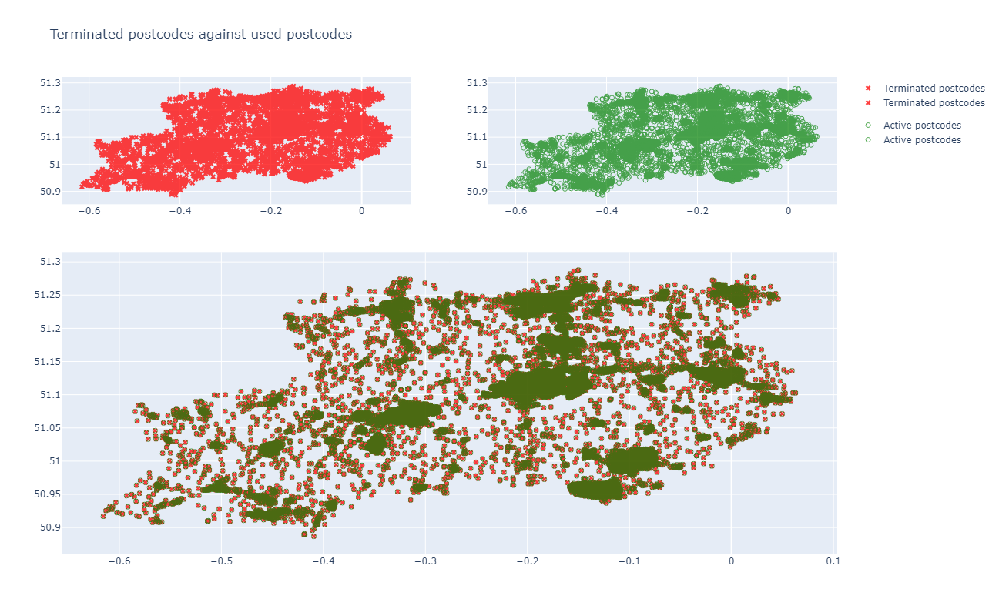

In [3]:
def plot_top_population_per_postcode(df):
    """Plots the five postcodes with highest populations, largest to smallest (I'll admit, a pointless plot for the task set but leaving it in anyway)"""
    # Check how many areas have population data
    total_records = df["Population"].shape[0]

    # Filter records to only store those with valid populations
    df = df[df["Population"].notna()]

    print(
        f"There are {df['Population'].astype(int).shape[0]}/{total_records} records with valid population data"
    )
    # Print the top 5 records with the highest populations
    # Convert population column value datatype to integers from object/string
    df["Population"] = df["Population"].astype(int)
    # Sort records in dataframe by population value in descending order
    df = df.sort_values("Population", ascending=False)
    x = df["Postcode"].head(5)
    y = df["Population"].head(5).tolist()
    plt.figure(figsize=graph_size)
    plt.bar(x, y)
    plt.title("Populations per postcode")
    plt.xlabel("Postcodes")
    plt.ylabel("Population") 
    # plt.grid(visible=False)
    addlabels(x, y)
    plt.show()


def add_terminated_postcodes_plot(df, area, showlegend):
    """Plots the postcodes that have been terminated

    Args:
        df (pd.DataFrame): Uncleaned postcode area data
        area (str): Postcode area
    """
    # Partial cleaning on temporary dataframe
    # Filter data to only include terminated postcodes
    df = df[df["Terminated"] != ""]
    # Replace lat/long values that equal 0 with null values
    df["Longitude"] = df["Longitude"].replace(0, np.nan)
    df["Latitude"] = df["Latitude"].replace(0, np.nan)
    # Remove any and all rows with null long/lat values
    df.dropna(axis=0, how="any", subset=["Latitude", "Longitude"], inplace=True)

    # Initialise longitude/latitude values
    longitudes = df["Longitude"].tolist()
    latitudes = df["Latitude"].tolist()
    trace = go.Scatter(
        x=longitudes,
        y=latitudes,
        name="Terminated postcodes",
        mode="markers",
        legendgroup="Terminated",
        showlegend=showlegend,
        opacity=0.75,
        text=df["Postcode"],
        marker=dict(
            symbol="x",
            color="Red",
        ),
    )
    return trace


def add_postcode_area_long_lat_plot(df, area, showlegend):
    """Plots longitude and latitude coordinates of each postcode on scatter plot

    Args:
        df (pd.DataFrame): postcode area data
        area (str): postcode area
    """
    # Initialise longitude/latitude values
    longitudes = df["Longitude"].tolist()
    latitudes = df["Latitude"].tolist()

    trace = go.Scatter(
        x=longitudes,
        y=latitudes,
        name="Active postcodes",
        legendgroup="Active",
        showlegend=showlegend,
        mode="markers",
        text=df["Postcode"],
        opacity=0.7,
        marker=dict(
            symbol="circle-open",
            color="Green",
        ),
    )

    return trace


def plot_terminated_active_postcodes(df):
    """Plots terminated and active postcodes on separate plots and in the same plot all in the same figure
    Used to visually identify if terminated postcodes are in separate areas than active postcodes.

    Args:
        df (pd.DataFrame): postcode area data
    """
    fig = make_subplots(
        rows=3,
        cols=2,
        specs=[
            [{}, {}],
            [{"rowspan": 2, "colspan": 2}, None],
            [None, None],
        ],
    )
    showlegend = True
    terminated = add_terminated_postcodes_plot(df, "RH", showlegend)

    df = clean_data(df)
    # plot_top_population_per_postcode(df)
    active = add_postcode_area_long_lat_plot(df, "RH", showlegend)

    trace1 = add_terminated_postcodes_plot(df, "RH", showlegend)
    trace2 = add_postcode_area_long_lat_plot(df, "RH", showlegend)

    fig.add_trace(terminated, row=1, col=1)
    fig.add_trace(active, row=1, col=2)
    fig.add_trace(terminated, row=2, col=1)
    fig.add_trace(active, row=2, col=1)
    # TODO: Have single legends for active and terminate postcodes
    fig.update_layout(
        height=800, width=1200, title_text="Terminated postcodes against used postcodes"
    )
    fig.show()


df = pd.read_csv("data/RH_postcodes.csv")
plot_terminated_active_postcodes(df)


Originally I was intending to remove any and all terminated postcodes from the dataset. However, upon zooming into the plot containing both terminated and active postcodes, it's obvious there are thousands of 'Terminated' postcodes that are in locations far away from 'active' postcodes. This makes these areas valid locations unless these locations are occupied by some other form of postcode... Therefore I will be keeping the terminated postcodes in use as travelling from these locations is still viable whether they're used as a means to identify the location of housing or not.

## Postcode Quality
The dataset has a column 'Quality' which seems to have some reference to distance each postcode has relative to its surroundings. 

> A Data Quality Flag for the current row. Values are as follows:

> 1 = within the building of the matched address closest to the postcode mean.

> 2 = as for status value 1, except by visual inspection of Landline maps (Scotland only).

> 3 = approximate to within 50 metres.

> 4 = postcode unit mean (mean of matched addresses with the same postcode, but not snapped to a building).

> 5 = imputed by ONS, by reference to surrounding postcode grid references.

> 6 = postcode sector mean, (mainly PO Boxes).

> 7 = deliberately left blank

> 8 = postcode terminated prior to Gridlink initiative, last known ONS postcode grid reference.

> 9 = no grid reference available.

However, I'm unsure how I would incorporate this information into the clustering algorithm since I'm unsure what the quality value is relative to (regarding surrounding or other locations)

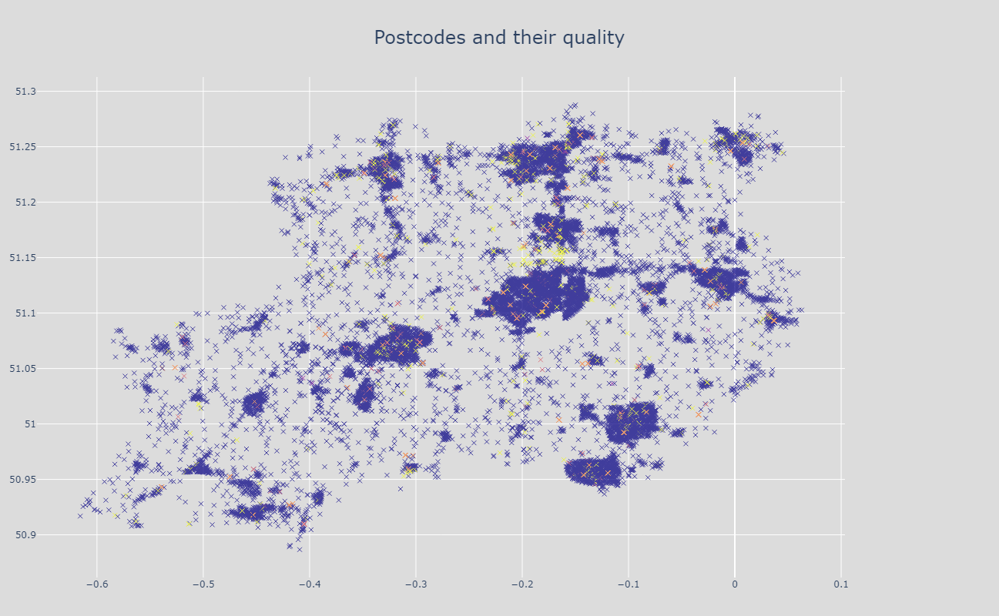

In [4]:
def plot_postcode_quality(df):
    # Replace lat/long values that equal 0 with null values
    df["Longitude"] = df["Longitude"].replace(0, np.nan)
    df["Latitude"] = df["Latitude"].replace(0, np.nan)
    # Remove any and all rows with null long/lat values
    df.dropna(axis=0, how="any", subset=["Latitude", "Longitude"], inplace=True)

    # Initialise longitude/latitude values
    longitudes = df["Longitude"].tolist()
    latitudes = df["Latitude"].tolist()

    qualities = {
        1: "within the building of the matched address closest to the postcode mean.",
        2: "as for status value 1, except by visual inspection of Landline maps (Scotland only).",
        3: "approximate to within 50 metres.",
        4: "postcode unit mean (mean of matched addresses with the same postcode, but not snapped to a building).",
        5: "imputed by ONS, by reference to surrounding postcode grid references.",
        6: "postcode sector mean, (mainly PO Boxes).",
        7: "deliberately left blank",
        8: "postcode terminated prior to Gridlink initiative, last known ONS postcode grid reference.",
        9: "no grid reference available.",
    }

    trace = go.Scatter(
        x=longitudes,
        y=latitudes,
        name="Postcodes and their quality",
        mode="markers",
        opacity=0.75,
        text=[
            f"Postcode: {postcode}<br>Quality: {quality}<br>{qualities[quality]}" for postcode, quality in zip(df['Postcode'], df['Quality'])
        ],
        marker=dict(
            symbol="x-thin-open",
        ),
    )

    trace.marker.color = [quality for quality in df["Quality"]]
    fig = go.Figure(
        data=[trace],
        layout=go.Layout(
            autosize=False,
            width=1200,
            height=800,
            title={
                "text": f"Postcodes and their quality",
                "y": 0.95,  # new
                "x": 0.5,
                "xanchor": "center",
                "yanchor": "top",  # new
            },
            titlefont_size=24,
            hovermode="closest",
            # margin=dict(b=100, l=100, r=100, t=100),
            margin=dict(b=50, l=20, r=200, t=100),
            # paper_bgcolor='rgb(200,200,200)', # transparent background
            paper_bgcolor="rgb(220,220,220)",  # transparent background
            plot_bgcolor="rgb(220,220,220)",  # transparent 2nd background
        ),
    )

    fig.show()


plot_postcode_quality(df)


## Postcode Quality
When hovering over the nodes, you can see which postcodes have which quality rating and the corresponding quality rating description. However, I'm still unsure how to incorporate this into the unsupervised clustering algorithm as I feel it could have some influence.

## Representative datapoint/postcode
Originally I pursued finding the centroid of a cluster but this didn't always result in an actual postcode/datapoint being the centroid. E.g. if a postcode was located at (0, -0.0175) and the other postcode was located at (0, 0.0175), the centroid would be (0,0), very far away from either datapoint. However, from research I discovered the "Medoid". Medoids are representative objects of a cluster. Thus I used K-Medoids algorithm and set the cluster to 1 as to limit it to the cluster I give it and extracted the medoid which I used as a representative postcode/datapoint for the cluster it was in. The representative datapoints in the dataset are represented by a boolean in the "Representative" column.

## Plotting Clustered Postcode Data
I used matplotlib and eventually upgraded to plotly to create a scatter plot containing all of the postcodes and the colours are set based on the cluster each postcode belongs to. Cluster -1 represents an independent postcode that has no cluster because it's too far away from any.

In [5]:
def plot_data_kmeans(X, postcode_area):
    clusters = 3
    # Apply k means clustering
    kmeans = KMeans(n_clusters=clusters, init="k-means++")
    kmeans.fit(X[X.columns[1:clusters]])  # Compute k-means clustering.
    X["cluster_label"] = kmeans.fit_predict(X[X.columns[1:clusters]])
    centers = kmeans.cluster_centers_  # Coordinates of cluster centers.
    labels = kmeans.predict(X[X.columns[1:clusters]])  # Labels of each point

    plt.figure(figsize=graph_size)
    plt.title(f"K-Means : {graph_style}")
    plt.style.use(graph_style)
    plt.grid(b=None)
    # # X.plot.scatter(x = 'Latitude', y = 'Longitude', c=labels, s=50, cmap='viridis')
    plt.title(f"K-Means Clustering  : Postcode area: {postcode_area}")
    plt.xlabel("Latitude")
    plt.ylabel("Longitude")
    plt.scatter(
        X.Latitude,
        X.Longitude,
        c=labels,
        cmap="Set3",
        s=100,
        edgecolors="gray",
        linewidths=1,
    )

    plt.scatter(
        centers[:, 0],
        centers[:, 1],
        c="black",
        s=300,
        alpha=0.9,
        marker="o",
        edgecolors="gray",
        linewidths=10,
    )
    plt.show()


def plotly_single_postcode_kmeans(df, postcode_area):
    """Plot a single postcode k-means plot

    Args:
        postcode_area (str): beginning of postcode
    """
    X = df[["Postcode", "Latitude", "Longitude"]]
    # Filter data to only contain RG1 Postcodes
    X = X[X.Postcode.str.contains(postcode_area)]
    # If there's no postcodes beginning with postcode_area, skip this loop
    if X.shape[0] == 0:
        return
    # Elbow plots
    # plot_elbow_curve(postcode_area)
    # plot_data_kmeans(X, postcode_area)
    plotly_postcode_area(X, postcode_area)


def plotly_postcode_area_clusters(df, postcode_area, method):
    """Plot a single postcode areas DBSCAN / k-means plot
    Args:
        postcode_area (str): beginning of postcode
    """

    X = df[["Postcode", "Latitude", "Longitude"]]
    # Filter data to only contain RG1 Postcodes
    X = X[X.Postcode.str.contains(postcode_area)]
    # If there's no postcodes beginning with postcode_area, skip this loop
    if X.shape[0] == 0:
        return
    # Plot(ly) postcode area
    plotly_postcode_area(X, postcode_area, method)


def kmeans(X):
    kmeans = KMeans(n_clusters=3, init="k-means++")
    kmeans.fit(X[["Longitude", "Latitude"]])  # Compute k-means clustering.
    X["cluster_label"] = kmeans.fit_predict(X[["Longitude", "Latitude"]])
    X["cluster_text"] = (
        "Cluster " + X["cluster_label"].astype(str) + "<br>" + X["Postcode"]
    )
    centers = kmeans.cluster_centers_  # Coordinates of cluster centers.
    labels = kmeans.predict(X[["Longitude", "Latitude"]])  # Labels of each point
    return X


def dbscan(X):
    model = DBSCAN(eps=0.0005, min_samples=2).fit(X[["Longitude", "Latitude"]])
    class_predictions = model.labels_
    X["CLUSTER_DBSCAN"] = class_predictions
    X["CLUSTER_DBSCAN_LABEL"] = (
        "Cluster " + X["CLUSTER_DBSCAN"].astype(str) + "<br>" + X["Postcode"]
    )
    return X


def plotly_postcode_area(X, area, method):
    # Apply k means clustering
    if method == "kmeans":
        X = kmeans(X)
        # Create figure with Kmeans
        fig = go.Figure(
            data=go.Scatter(
                x=X["Longitude"],
                y=X["Latitude"],
                text=X["cluster_text"],
                mode="markers",
                marker_symbol="circle-open",
                marker_color=X["cluster_label"],
            ),
            layout=go.Layout(
                width=800,
                height=800,
                paper_bgcolor="rgb(240,240,240)",  # transparent background
                plot_bgcolor="rgb(240,240,240)",  # transparent 2nd background
            ),
        )
    elif method == "DBSCAN":
        X = dbscan(X)
        # Create figure with DBSCAN
        fig = go.Figure(
            data=go.Scatter(
                x=X["Longitude"],
                y=X["Latitude"],
                text=X["CLUSTER_DBSCAN_LABEL"],
                mode="markers",
                marker_symbol="circle-open",
                marker_color=X["CLUSTER_DBSCAN"],
            ),
            layout=go.Layout(
                width=800,
                height=800,
            ),
        )

    fig.update_layout(
        height=600,
        width=800,
        margin={"r": 0, "t": 25, "l": 0, "b": 0},
        title=dict(text=f"Postcode Area: {area}", x=0.5),
        template="plotly_dark",
    )

    # fig.update_geos(fitbounds="locations")
    fig.show()


def identify_and_set_single_representative_datapoint(cluster, df):
    """Identifies and sets a single representative datapoint for a single cluster

    Args:
        cluster (int): cluster value
        df (pd.DataFrame): postcode dataframe

    Returns:
        pd.DataFrame: Dataframe containing representative datapoint
    """
    temp = df[df["CLUSTER_DBSCAN"] == cluster]
    x = temp["Latitude"].tolist()
    y = temp["Longitude"].tolist()
    GetMedoid = (
        lambda vX: KMedoids(n_clusters=1)
        .fit(temp[["Latitude", "Longitude"]])
        .cluster_centers_
    )
    # Got medoid
    medoid = GetMedoid([x, y])[0]
    # X.loc[(X["Latitude"] == medoid[0]) & (X["Longitude"] == medoid[1]), "Representative"]
    results = temp[temp["Latitude"] == medoid[0]]
    results = temp[temp["Longitude"] == medoid[1]]
    results = results.reset_index()
    results.loc[:0, "Representative"] = True

    # Where latitude and longitude values match medoid, replace those rows with results
    try:
        df.loc[
            (df["Latitude"] == medoid[0]) & (df["Longitude"] == medoid[1]),
            "Representative",
        ] = results["Representative"].tolist()
    except:
        pass
    return df


def set_all_representative_datapoints(df):
    """Sets all representative datapoints in postcode data

    Args:
        df (pd.DataFrame): postcode area data

    Returns:
        pd.DataFrame: postcode area data containing representative datapoints
    """
    df["Representative"] = False
    for i in df["CLUSTER_DBSCAN"].unique():
        # -1 represents a node that has no cluster - it's independent
        if i == -1:
            # Each independent postcode is representative - set it to True
            df.loc[(X["CLUSTER_DBSCAN"] == i), "Representative"] = True
            continue
        df = identify_and_set_single_representative_datapoint(i, df)
    # print(temp[temp['Representative'] != False].shape)
    print("[*]\tRepresentative data points set")
    return df


def plot_cluster_and_rep_point(cluster, df):
    """Plots the cluster and shows representative datapoint

    Args:
        cluster (int): The cluster value
        df (pd.DataFrame): Dataframe with all postcode data
    """
    df = df[df["CLUSTER_DBSCAN"] == cluster]
    df["CLUSTER_DBSCAN_LABEL"] = (
        "Cluster "
        + df["CLUSTER_DBSCAN"].astype(str)
        + "<br>"
        + df["Postcode"]
        + "<br>Representative Postcode: "
        + df["Representative"].astype(str)
    )

    fig = make_subplots(
        rows=1,
        cols=1,
        specs=[
            [{}],
        ],
    )
    temp = df[df["Representative"] == True]
    representative = go.Scatter(
        x=temp["Longitude"],
        y=temp["Latitude"],
        text=temp["CLUSTER_DBSCAN_LABEL"],
        mode="markers",
        name="Representative Postcode",
        marker=dict(symbol="x-thin-open", color="blue", size=16),
    )
    temp = df[df["Representative"] == False]
    non_representative = go.Scatter(
        x=temp["Longitude"],
        y=temp["Latitude"],
        text=temp["CLUSTER_DBSCAN_LABEL"],
        mode="markers",
        name="Non-Representative Postcode",
        marker=dict(symbol="circle-open", color="black", size=16),
    )

    fig.add_trace(representative)
    fig.add_trace(non_representative)

    fig.update_layout(
        width=800,
        height=400,
        title=f"{len(df['CLUSTER_DBSCAN'])} postcodes : Cluster {cluster}",
        xaxis=dict(title="Longitude", tickformat=".3f"),
        yaxis=dict(title="Latitude", tickformat=".3f"),
        font=dict(family="Arial", size=18, color="Black"),
    )
    fig.show()


def plot_clusters_with_more_than_five_postcodes(data):
    """Plots clusters and their representative points with more than five postcodes in their cluster

    Args:
        X (pd.DataFrame): Processed and clustered postcode area data
    """
    data = data[data["Representative"] == True]
    for cluster in data["CLUSTER_DBSCAN"]:
        # Ignore clusters with less than 5 postcodes
        if len(data[data["CLUSTER_DBSCAN"] == cluster]) < 5:
            continue
        # Ignore cluster -1 : These are independent datapoints / postcodes
        if cluster == -1:
            continue
        plot_cluster_and_rep_point(cluster, data)


# Load in and clean RH postcode data
df = clean_data(pd.read_csv("data/RH_postcodes.csv"))
# Perform DBSCAN clustering on dataframe
X = dbscan(df)
# Create new column stating whether each postcode is representative of its cluster - set all to False
X["Representative"] = False
# Set the representative boolean to true for each representative postcode in each cluster
X = set_all_representative_datapoints(X)
# Save filtered data containing relevant clustering / representative point data
X[['Postcode', 'Longitude', 'Latitude', 'CLUSTER_DBSCAN', 'Representative']].to_csv('qk007990_S2T2_RH.csv', index = False)


[*]	Representative data points set


## Optimal clusters / epsilon value
Originally, I attempted to classic K-Means Clustering algorithm but quickly realised it wasn't well suited to clustering dense groups of long/lat coordinates. However, I thought I'd test K-Means anyway and I needed to find out roughly how many clusters were optimal for the data. After plotting the elbow curve, it indicated that only 3 clusters were needed which highlighted how unsuited this clustering algorithm was since the distance between some postcodes in a single cluster could be 10km+ away from eachother, thus a representative datapoint wouldn't provide accurate travel durations / distances for the surrounding postcodes in the same clusters.

After research, I discovered another unsupervised clustering algorithm called DBSCAN which seemed to specifically cater denser areas of nodes which was based on an epsilon hyperparameter. Thanks to the resource linked below, I plotted a similar line graph to the elbow curve and similar principle was applied of finding the sharpest point and taking the y axis value of that point as an estimate for the epsilon value. However, upon execution of dbscan with the epsilon value at 0.002, this ended up clustering/chaining with postcodes up to a 3 miles radius which is very impactful on travel durations/distance if I was retrieving that data from a representative datapoint/postcode. Thus, through trial and error, I reduced epsilon to 0.0005 which seemed to cluster the denser areas of postcodes a lot better. 

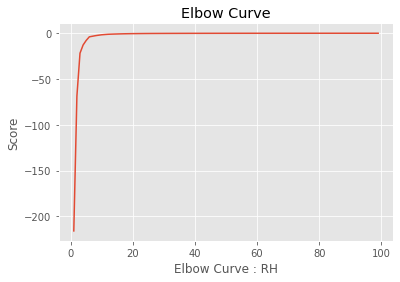

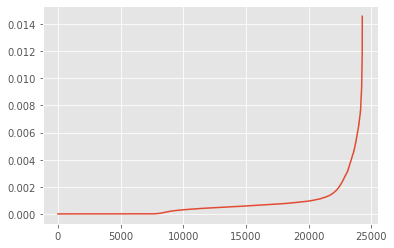

In [6]:
def plot_elbow_curve(df, postcode_area):
    # Refine dataframe to only include lat/long columns
    X = df.loc[:, ["Latitude", "Longitude"]]
    # Elbow curve for optimal number of clusters for kmeans
    K_clusters = range(1, 100)
    kmeans = [KMeans(n_clusters=i) for i in K_clusters]
    Y_axis = df[["Latitude"]]
    X_axis = df[["Longitude"]]
    score = [kmeans[i].fit(Y_axis).score(Y_axis) for i in range(len(kmeans))]
    # Visualize
    plt.style.use(graph_style)
    plt.plot(K_clusters, score)
    plt.xlabel(f"Elbow Curve : {postcode_area}")
    plt.ylabel("Score")
    plt.title("Elbow Curve")
    plt.show()


# https://towardsdatascience.com/machine-learning-clustering-dbscan-determine-the-optimal-value-for-epsilon-eps-python-example-3100091cfbc
def plot_epsilon_curve(X):
    """Plots a curve indicating the optimal epsilon value for DBSCAN at the sharpest point

    Args:
        X (pd.DataFrame): postcode area data
    """
    neigh = NearestNeighbors(n_neighbors=2)
    nbrs = neigh.fit(df[['Longitude', 'Latitude']])
    distances, indices = nbrs.kneighbors(df[['Longitude', 'Latitude']])
    distances = np.sort(distances, axis=0)
    distances = distances[:,1]
    plt.title = "Epsilon Curve"
    plt.plot(distances)


plot_elbow_curve(X, "RH")

plot_epsilon_curve(X)

## Plots postcode area data using DBSCAN clustering for the colours
Plotted all RH postcode area data to graph and the colours of the nodes are determined by the clusters each postcode node belongs to.

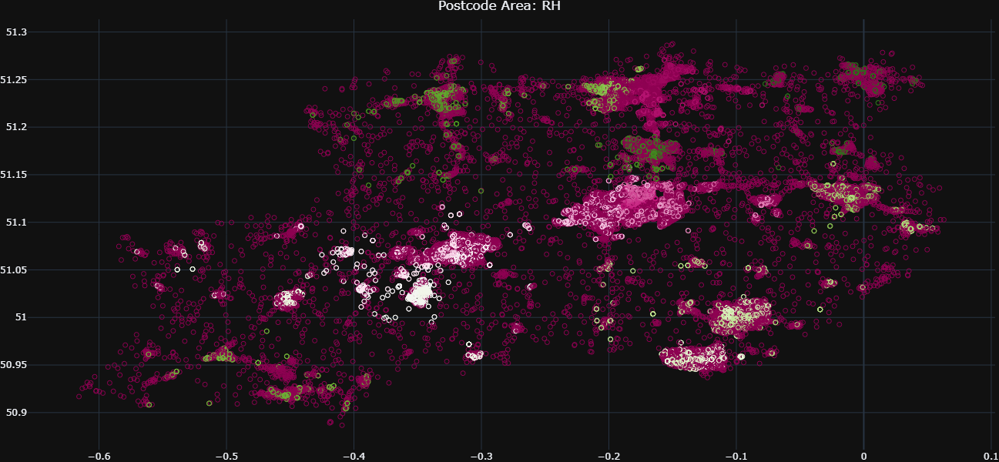

In [7]:
plotly_postcode_area(X, "RH", "DBSCAN")

In [8]:

print(f"Clusters in postcode area data: {X['CLUSTER_DBSCAN'].unique()}")
# Used to derive best graph
plot_clusters_with_more_than_five_postcodes(X)
# Plot best representation of representative point in cluster of postcodes
# plot_cluster_and_rep_point(73, X)

Clusters in postcode area data: [   0    1    2 ... 2415 2416 2417]


## Google Maps API requests / Table output
I make requests to google maps api for journey durations / distances. Generating the csv takes a long time due to each request happening synchronously. This function ideally needs to be asynchronous so the requests can be done concurrently. Due to time constraints, I'm going to only iterate through the first 1000 rows of postcode area data. The output table won't have 1000 rows due to a few outlier postcodes that belong to clusters without representative datapoints due to me limiting the number of rows in the dataframe.

In [9]:
def get_distances_to_from_locations_refined(postcode_area_data):
    """Creates a table filled with travel times for walking, car, transit transportation methods.
    Caters for representative datapoints - reducing number of requests to perform.
    Args:
        postcode_area_data (pd.DataFrame): Dataframe containing all postcode data
    """

    display(postcode_area_data[["Postcode", "CLUSTER_DBSCAN", "Representative"]])
    journey_data = []
    travel_methods = ["driving", "transit", "walking"]
    req = 0
    # Refine dataframe down to representative data points
    sample = postcode_area_data[postcode_area_data["Representative"] == True]

    # No representative datapoints
    print(f"Iterating through {len(sample)}")
    for index, row in sample.iterrows():
        now = datetime.now()
        coord = f"{row['Latitude']}, {row['Longitude']}"
        distance = ""
        travel_times = []
        travel_distances = []
        # For each of the three travel methods
        for travel_method in travel_methods:
            # Send request for travel time using the travel_method specified
            journey = client.directions(
                coord, "51.457625,-0.945636", mode=travel_method, departure_time=now
            )
            # Retrieve distance travelled and time taken to travel
            try:
                distance = journey[0]["legs"][0]["distance"]["text"]
                travel_time = journey[0]["legs"][0]["duration"]["text"]
            except:
                distance = 0
                travel_time = 0
            # Append times and distances to list
            travel_distances.append(distance)
            travel_times.append(travel_time)

        req += 1
        # Initialise variables for table's column values
        postcode = row["Postcode"]
        drive_time = travel_times[0]
        transit_time = travel_times[1]
        walking_time = travel_times[2]
        drive_distance = travel_distances[0]
        transit_distance = travel_distances[1]
        walking_distance = travel_distances[2]
        # TODO: Add different transportation distances?
        postcode_journey_data = pd.DataFrame(
            {
                "from_postcode": postcode,
                "driving_duration": drive_time,
                "driving_distance": drive_distance,
                "transit_time": transit_time,
                "transit_distance": transit_distance,
                "walking_time": walking_time,
                "walking_distance": walking_distance,
            },
            index=[0],
        )
        journey_data.append(postcode_journey_data)
        end = datetime.now()
        print(req, end - now)

    # Create dataframe from list of journey data
    df = pd.concat(journey_data).reset_index()
    del df["index"]

    other_postcodes_journey_data = []
    # For each representative point
    for row in df.itertuples():
        # Identify cluster of representative point
        representative_postcode = postcode_area_data[
            postcode_area_data["Postcode"] == row.from_postcode
        ]
        cluster = representative_postcode.iloc[0]["CLUSTER_DBSCAN"]
        # Skip independent datapoints
        if cluster == -1:
            continue

        # Find other postcodes
        other_postcodes = postcode_area_data[
            postcode_area_data["CLUSTER_DBSCAN"] == cluster
        ]
        other_postcodes = other_postcodes[
            other_postcodes["Postcode"] != row.from_postcode
        ]
        other_postcodes = other_postcodes["Postcode"]
        if other_postcodes.shape[0] == 0:
            continue
        # other_postcodes = other_postcodes.rename(columns=other_postcodes.iloc[0]).drop(other_postcodes.index[0])

        for postcode in other_postcodes:
            # Replace the other postcode's data with this data for walking,driving, bus times
            other_postcodes_journey_data.append(
                pd.DataFrame(
                    {
                        "from_postcode": postcode,
                        "driving_duration": row.driving_duration,
                        "driving_distance": row.driving_distance,
                        "transit_time": row.transit_time,
                        "transit_distance": row.transit_distance,
                        "walking_time": row.walking_time,
                        "walking_distance": row.walking_distance,
                    },
                    index=[0],
                )
            )
    result = pd.concat(other_postcodes_journey_data)
    result = result.append(df)
    # TODO: Replace rows where postcodes match that in results with values
    result.to_csv("qk007990_S2T3_RH.csv", index=False)


get_distances_to_from_locations_refined(X.head(1000))


,Postcode,CLUSTER_DBSCAN,Representative
0,RH1 1AA,0,True
1,RH1 1AB,1,False
2,RH1 1AD,2,False
3,RH1 1AE,2,True
4,RH1 1AF,-1,True
...,...,...,...
995,RH1 4HQ,110,False
996,RH1 4HR,-1,True
997,RH1 4HS,-1,True
998,RH1 4HT,110,False


Iterating through 478
1 0:00:00.805856
2 0:00:00.751032
3 0:00:00.729707
4 0:00:00.706106
5 0:00:00.782290
6 0:00:00.806686
7 0:00:00.719625
8 0:00:00.729852
9 0:00:00.786829
10 0:00:00.739768
11 0:00:00.766453
12 0:00:00.778589
13 0:00:00.685724
14 0:00:00.737913
15 0:00:00.753098
16 0:00:00.765028
17 0:00:00.687420
18 0:00:00.740768
19 0:00:00.709367
20 0:00:00.738601
21 0:00:00.676260
22 0:00:00.678000
23 0:00:00.678075
24 0:00:00.695000
25 0:00:00.721653
26 0:00:00.648309
27 0:00:00.652937
28 0:00:00.683691
29 0:00:00.726328
30 0:00:00.648999
31 0:00:00.686069
32 0:00:00.804282
33 0:00:00.661824
34 0:00:00.641082
35 0:00:00.737744
36 0:00:00.779303
37 0:00:00.726567
38 0:00:00.687125
39 0:00:00.742181
40 0:00:00.658078
41 0:00:00.757500
42 0:00:00.669421
43 0:00:00.723833
44 0:00:00.653977
45 0:00:00.673094
46 0:00:00.793154
47 0:00:00.650912
48 0:00:00.585948
49 0:00:00.773440
50 0:00:00.663364
51 0:00:00.795092
52 0:00:00.622683
